## Imports

Here we import and install some necessary libraries for generating pseudo lidar. The environment is google colab.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2 
import tqdm 
import os
import glob
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import torch.utils.data as data
import torchvision.transforms as transforms
import torch.optim as optim
from PIL import Image
import logging
import random
import time
from collections import OrderedDict
import skimage
import skimage.io
import skimage.transform
from tqdm.notebook import tqdm
# point cloud visualization
import plotly.express as px

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## Data Understanding

There are three types of data needed for generating pseudo lidar:
1. images taken by the left camera
2. images taken by the right camera
3. velodyne point cloud

There are also some additional information needed, such as:
1. camera calibration matrices
2. training labels

First let's change the working directory.

In [ ]:
os.chdir('/content/drive/MyDrive/kitti/data/kitti/object')

Get the paths for left images, right images and velodyne.

In [ ]:
left_image_paths = glob.glob("training/image_2/*")
right_image_paths = glob.glob("training/image_3/*")
velodyne_paths = glob.glob('training/velodyne/*')

let's write some helper functions for visualizations. Some of the parameters are hard coded, don't worry about them for now. They are just for better visualizations.

In [ ]:
def load_velo_scan(velo_filename):
    scan = np.fromfile(velo_filename, dtype=np.float32)
    scan = scan.reshape((-1, 4))
    return scan

def paint_points(points, color=[192,0,0]):
    # color = [r, g, b]
    color = np.array([color])
    new_pts = np.zeros([points.shape[0],6])
    new_pts[:,:3] = points
    new_pts[:, 3:] = new_pts[:, 3:] + color
    return new_pts

def read_image(img_path, show=False):
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  if show:
    plt.imshow(img)
  else:
    return img

def show_point_cloud(pc_path):
  points = load_velo_scan(pc_path)[:,:3]
  pd_points = pd.DataFrame(paint_points(points), columns=['x','y','z','red','green','blue'])
  pd_points = pd_points.query(f'z>=-2 and z<=1').reset_index(drop=True)
  pd_points = pd_points.query('x>=-20 and x<=20').reset_index(drop=True)
  pd_points = pd_points.query('y>=-20 and y<=20').reset_index(drop=True)
  # pd_points['flipped_y'] = pd_points['y']
  fig = px.scatter_3d(pd_points, x='x', y='y', z='z')
  fig.update_traces(marker=dict(size=0.3))
  fig.show()

def show_point_cloud_v2(points):
  pd_points = pd.DataFrame(paint_points(points), columns=['x','y','z','red','green','blue'])
  # pd_points['y'] = -pd_points['y']
  fig = px.scatter_3d(pd_points, x='x', y='y', z='z')
  fig.update_traces(marker=dict(size=0.3))
  fig.show()

def show_bev(pc_path, z_min, z_max):
  points = load_velo_scan(pc_path)[:,:3]
  pd_points = pd.DataFrame(paint_points(points), columns=['x','y','z','red','green','blue'])
  pd_points = pd_points.query(f'z>={z_min} and z<={z_max}').reset_index(drop=True)
  pd_points = pd_points.query('x>=-20 and x<=20').reset_index(drop=True)
  pd_points = pd_points.query('y>=-20 and y<=20').reset_index(drop=True)
  plt.figure(figsize=(8,12))
  plt.scatter(-pd_points.y, pd_points.x, s=0.01)

Image taken by left camera.

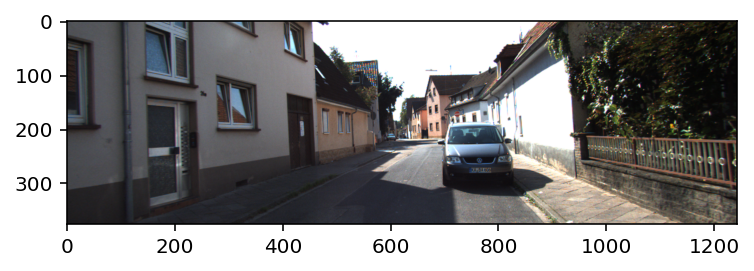

In [ ]:
read_image(left_image_paths[0], show=True)

Image taken by right camera.

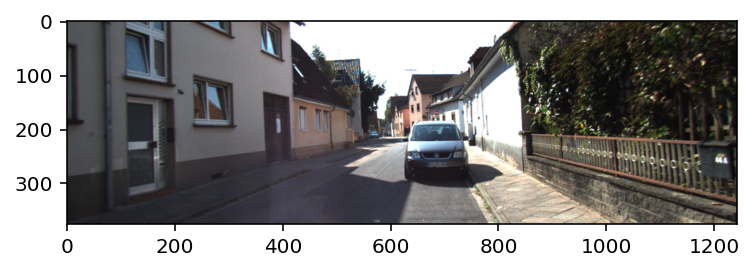

In [ ]:
read_image(right_image_paths[0], show=True)

Point cloud displayed from a bird eye view. We can clearly see that there are two cars. The center region that was left blank is the region that the lidar cannot cover.

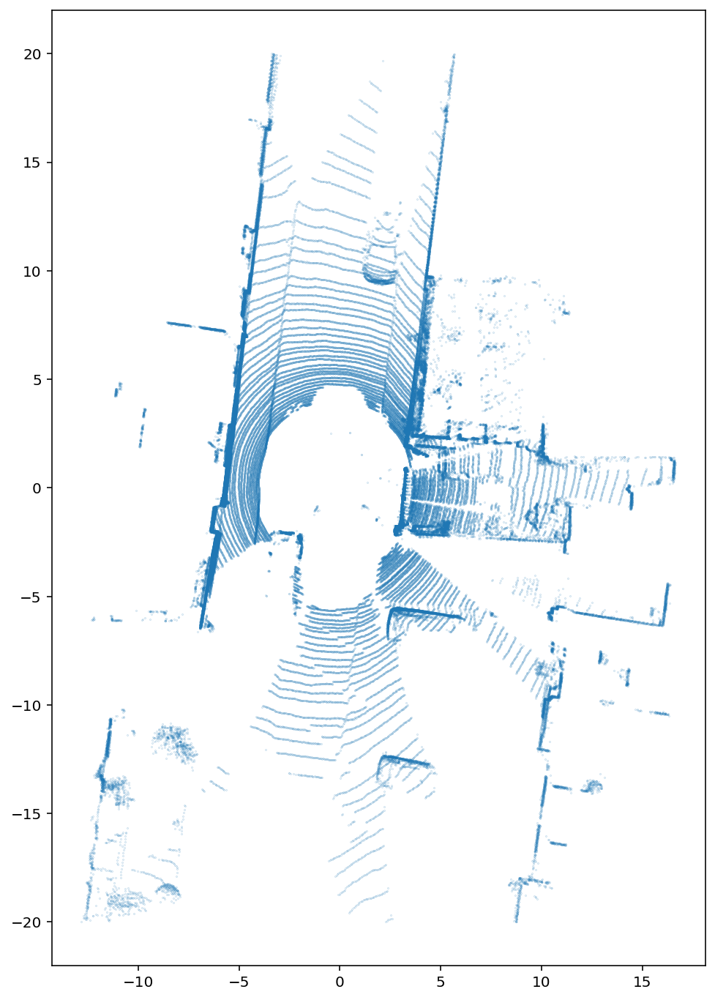

In [ ]:
show_bev('training/velodyne/004559.bin', -2, 1)

3D visualization of point cloud.

In [ ]:
show_point_cloud('training/velodyne/004559.bin')

## Generate disparities
in order to estimate depth, we need to generate the disparity maps. A stereo disparity estimation algorithm takes a pair of left-right images as input with a horizontal offset (the distance between two cameras) and output a disparity map Y. We can use this disparity map to get the depth via **D(u,v) = f_U x b / Y(u,v)**. Similarly, we can get disparity map via **Y(u,v) = f_U x b / D(u,v)**

First of all, let's get some utility functions.

In [ ]:
class Calibration(object):
    ''' Calibration matrices and utils
        3d XYZ in <label>.txt are in rect camera coord.
        2d box xy are in image2 coord
        Points in <lidar>.bin are in Velodyne coord.
        y_image2 = P^2_rect * x_rect
        y_image2 = P^2_rect * R0_rect * Tr_velo_to_cam * x_velo
        x_ref = Tr_velo_to_cam * x_velo
        x_rect = R0_rect * x_ref
        P^2_rect = [f^2_u,  0,      c^2_u,  -f^2_u b^2_x;
                    0,      f^2_v,  c^2_v,  -f^2_v b^2_y;
                    0,      0,      1,      0]
                 = K * [1|t]
        image2 coord:
         ----> x-axis (u)
        |
        |
        v y-axis (v)
        velodyne coord:
        front x, left y, up z
        rect/ref camera coord:
        right x, down y, front z
        Ref (KITTI paper): http://www.cvlibs.net/publications/Geiger2013IJRR.pdf
        TODO(rqi): do matrix multiplication only once for each projection.
    '''

    def __init__(self, calib_filepath):

        calibs = self.read_calib_file(calib_filepath)
        # Projection matrix from rect camera coord to image2 coord
        self.P = calibs['P2']
        self.P = np.reshape(self.P, [3, 4])
        # Rigid transform from Velodyne coord to reference camera coord
        self.V2C = calibs['Tr_velo_to_cam']
        self.V2C = np.reshape(self.V2C, [3, 4])
        self.C2V = inverse_rigid_trans(self.V2C)
        # Rotation from reference camera coord to rect camera coord
        self.R0 = calibs['R0_rect']
        self.R0 = np.reshape(self.R0, [3, 3])

        # Camera intrinsics and extrinsics
        self.c_u = self.P[0, 2]
        self.c_v = self.P[1, 2]
        self.f_u = self.P[0, 0]
        self.f_v = self.P[1, 1]
        self.b_x = self.P[0, 3] / (-self.f_u)  # relative
        self.b_y = self.P[1, 3] / (-self.f_v)

    def read_calib_file(self, filepath):
        ''' Read in a calibration file and parse into a dictionary.
        Ref: https://github.com/utiasSTARS/pykitti/blob/master/pykitti/utils.py
        '''
        data = {}
        with open(filepath, 'r') as f:
            for line in f.readlines():
                line = line.rstrip()
                if len(line) == 0: continue
                key, value = line.split(':', 1)
                # The only non-float values in these files are dates, which
                # we don't care about anyway
                try:
                    data[key] = np.array([float(x) for x in value.split()])
                except ValueError:
                    pass

        return data

    def cart2hom(self, pts_3d):
        ''' Input: nx3 points in Cartesian
            Oupput: nx4 points in Homogeneous by pending 1
        '''
        n = pts_3d.shape[0]
        pts_3d_hom = np.hstack((pts_3d, np.ones((n, 1))))
        return pts_3d_hom

    # =========================== 
    # ------- 3d to 3d ---------- 
    # =========================== 
    def project_velo_to_ref(self, pts_3d_velo):
        pts_3d_velo = self.cart2hom(pts_3d_velo)  # nx4
        return np.dot(pts_3d_velo, np.transpose(self.V2C))

    def project_ref_to_velo(self, pts_3d_ref):
        pts_3d_ref = self.cart2hom(pts_3d_ref)  # nx4
        return np.dot(pts_3d_ref, np.transpose(self.C2V))

    def project_rect_to_ref(self, pts_3d_rect):
        ''' Input and Output are nx3 points '''
        return np.transpose(np.dot(np.linalg.inv(self.R0), np.transpose(pts_3d_rect)))

    def project_ref_to_rect(self, pts_3d_ref):
        ''' Input and Output are nx3 points '''
        return np.transpose(np.dot(self.R0, np.transpose(pts_3d_ref)))

    def project_rect_to_velo(self, pts_3d_rect):
        ''' Input: nx3 points in rect camera coord.
            Output: nx3 points in velodyne coord.
        '''
        pts_3d_ref = self.project_rect_to_ref(pts_3d_rect)
        return self.project_ref_to_velo(pts_3d_ref)

    def project_velo_to_rect(self, pts_3d_velo):
        pts_3d_ref = self.project_velo_to_ref(pts_3d_velo)
        return self.project_ref_to_rect(pts_3d_ref)

    # =========================== 
    # ------- 3d to 2d ---------- 
    # =========================== 
    def project_rect_to_image(self, pts_3d_rect):
        ''' Input: nx3 points in rect camera coord.
            Output: nx2 points in image2 coord.
        '''
        pts_3d_rect = self.cart2hom(pts_3d_rect)
        pts_2d = np.dot(pts_3d_rect, np.transpose(self.P))  # nx3
        pts_2d[:, 0] /= pts_2d[:, 2]
        pts_2d[:, 1] /= pts_2d[:, 2]
        return pts_2d[:, 0:2]

    def project_velo_to_image(self, pts_3d_velo):
        ''' Input: nx3 points in velodyne coord.
            Output: nx2 points in image2 coord.
        '''
        pts_3d_rect = self.project_velo_to_rect(pts_3d_velo)
        return self.project_rect_to_image(pts_3d_rect)

    # =========================== 
    # ------- 2d to 3d ---------- 
    # =========================== 
    def project_image_to_rect(self, uv_depth):
        ''' Input: nx3 first two channels are uv, 3rd channel
                   is depth in rect camera coord.
            Output: nx3 points in rect camera coord.
        '''
        n = uv_depth.shape[0]
        x = ((uv_depth[:, 0] - self.c_u) * uv_depth[:, 2]) / self.f_u + self.b_x
        y = ((uv_depth[:, 1] - self.c_v) * uv_depth[:, 2]) / self.f_v + self.b_y
        pts_3d_rect = np.zeros((n, 3))
        pts_3d_rect[:, 0] = x
        pts_3d_rect[:, 1] = y
        pts_3d_rect[:, 2] = uv_depth[:, 2]
        return pts_3d_rect

    def project_image_to_velo(self, uv_depth):
        pts_3d_rect = self.project_image_to_rect(uv_depth)
        return self.project_rect_to_velo(pts_3d_rect)


def inverse_rigid_trans(Tr):
    ''' Inverse a rigid body transform matrix (3x4 as [R|t])
        [R'|-R't; 0|1]
    '''
    inv_Tr = np.zeros_like(Tr)  # 3x4
    inv_Tr[0:3, 0:3] = np.transpose(Tr[0:3, 0:3])
    inv_Tr[0:3, 3] = np.dot(-np.transpose(Tr[0:3, 0:3]), Tr[0:3, 3])
    return inv_Tr


Now let's write the function for generating disparities.

In [ ]:
def generate_disparity_from_velo(pc_velo, height, width, calib):
  # project point clouds to 2d (3d -> 2d)
  pts_2d = calib.project_velo_to_image(pc_velo)
  # define field of view, filter out points not in the image
  fov_inds = (pts_2d[:, 0] < width - 1) & (pts_2d[:, 0] >= 0) & \
            (pts_2d[:, 1] < height - 1) & (pts_2d[:, 1] >= 0)
  fov_inds = fov_inds & (pc_velo[:, 0] > 2)
  # get the points in the field of view
  imgfov_pc_velo = pc_velo[fov_inds, :] # 3d points in image fov
  imgfov_pts_2d = pts_2d[fov_inds, :] # 2d points in image fov
  # to rectangle
  imgfov_pc_rect = calib.project_velo_to_rect(imgfov_pc_velo)
  depth_map = np.zeros((height, width)) - 1
  imgfov_pts_2d = np.round(imgfov_pts_2d).astype(int)
  for i in range(imgfov_pts_2d.shape[0]):
      depth = imgfov_pc_rect[i, 2]
      depth_map[int(imgfov_pts_2d[i, 1]), int(imgfov_pts_2d[i, 0])] = depth
  baseline = 0.54
  disp_map = (calib.f_u * baseline) / depth_map
  return disp_map

In [ ]:
data_path = 'training/'
split_file = 'train.txt'

In [ ]:
lidar_dir = data_path + '/velodyne/'
calib_dir = data_path + '/calib/'
image_dir = data_path + '/image_2/'
disparity_dir = data_path + '/disparity/'

if not os.path.isdir(disparity_dir):
    os.makedirs(disparity_dir)

lidar_files = [x for x in os.listdir(lidar_dir) if x[-3:] == 'bin']
lidar_files = sorted(lidar_files)

with open(split_file, 'r') as f:
    file_names = [x.strip() for x in f.readlines()]

In [ ]:
def show_depth_disparity_map(lidar, calib, image):
  """
  visualize depth map, disparity map, original image
  """
  # get image shape
  height, width = image.shape[:2]
  fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(8,12))
  axes = axes.flatten()
  # obtain 2d points in the field of view
  pts_2d = calib.project_velo_to_image(lidar)
  # define field of view
  fov_inds = (pts_2d[:, 0] < width - 1) & (pts_2d[:, 0] >= 0) & \
            (pts_2d[:, 1] < height - 1) & (pts_2d[:, 1] >= 0)
  fov_inds = fov_inds & (lidar[:, 0] > 2)
  # get lidar point cloud from image fov and points 
  imgfov_pc_velo = lidar[fov_inds, :]
  imgfov_pts_2d = pts_2d[fov_inds, :]
  # project lidar point to rectangle
  imgfov_pc_rect = calib.project_velo_to_rect(imgfov_pc_velo)
  # intialize depth map
  depth_map = np.zeros((height, width)) - 1
  imgfov_pts_2d = np.round(imgfov_pts_2d).astype(int)
  # get depth map
  for i in range(imgfov_pts_2d.shape[0]):
      depth = imgfov_pc_rect[i, 2]
      depth_map[int(imgfov_pts_2d[i, 1]), int(imgfov_pts_2d[i, 0])] = depth
  # compute disparity map
  baseline = 0.54
  disp_map = (calib.f_u * baseline) / depth_map
  axes[0].set_title('Original Image')
  axes[0].imshow(image, interpolation='nearest', aspect='auto')
  axes[1].set_title('Point Cloud projected to image')
  axes[1].scatter(imgfov_pts_2d[:, 0], -imgfov_pts_2d[:, 1], s = 0.01)
  axes[2].set_title('Depth Map')
  axes[2].imshow((depth_map*256).astype('uint16'), cmap='gray')
  axes[3].set_title('Disparity Map')
  axes[3].imshow((disp_map*256).astype('uint16'),  cmap='gray')
  for i in axes:
    i.axis('off')
  return disp_map

In [ ]:
def get_lidar_calib_image_data(lidar_file):
  predix = lidar_file[:-4]
  calib_file = '{}/{}.txt'.format(calib_dir, predix)
  calib = Calibration(calib_file)
  lidar = np.fromfile(lidar_dir + '/' + lidar_file, dtype=np.float32).reshape((-1, 4))[:, :3]
  image_file = '{}/{}.png'.format(image_dir, predix)
  image = read_image(image_file)
  height, width = image.shape[:2]
  return lidar, calib, image

In [ ]:
lidar, calib, image = get_lidar_calib_image_data('004760.bin')

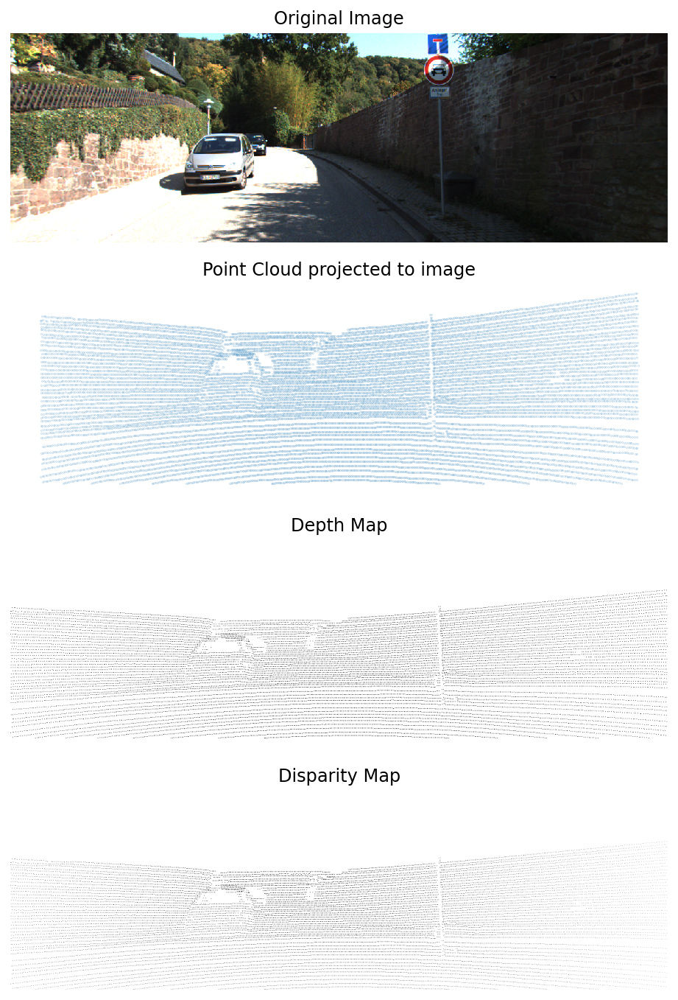

In [ ]:
a = show_depth_disparity_map(lidar, calib, image)

Let's generate the disparity map for all lidar point clouds in the directory as ground truth.

In [ ]:
if 0:
  for fn in lidar_files:
      predix = fn[:-4]
      if predix not in file_names:
          continue
      calib_file = '{}/{}.txt'.format(calib_dir, predix)
      calib = Calibration(calib_file)
      # load point cloud
      lidar = np.fromfile(lidar_dir + '/' + fn, dtype=np.float32).reshape((-1, 4))[:, :3]
      image_file = '{}/{}.png'.format(image_dir, predix)
      image = read_image(image_file)
      height, width = image.shape[:2]
      disp = generate_disparity_from_velo(lidar, height, width, calib)
      np.save(disparity_dir + '/' + predix, disp)
      print('Finish Disparity {}'.format(predix))

## Train Depth model
we have now generated the disparity maps as our ground truth, we will now train the depth model. In this paper, the author chose PSMNet. Pyramid stereo matching network (https://arxiv.org/abs/1803.08669). There are many ways to estimate depth; the most common way is via stereo matching. 

Write the modules needed to build PSMNet.

In [ ]:
# conv batchnorm
def convbn(in_planes, out_planes, kernel_size, stride, pad, dilation):

    return nn.Sequential(nn.Conv2d(in_planes, out_planes, kernel_size=kernel_size, stride=stride, padding=dilation if dilation > 1 else pad, dilation = dilation, bias=False),
                         nn.BatchNorm2d(out_planes))

# conv batchnorm 3d 
def convbn_3d(in_planes, out_planes, kernel_size, stride, pad):

    return nn.Sequential(nn.Conv3d(in_planes, out_planes, kernel_size=kernel_size, padding=pad, stride=stride,bias=False),
                         nn.BatchNorm3d(out_planes))

# basic block
class BasicBlock(nn.Module):
    expansion = 1
    def __init__(self, inplanes, planes, stride, downsample, pad, dilation):
        super(BasicBlock, self).__init__()

        self.conv1 = nn.Sequential(convbn(inplanes, planes, 3, stride, pad, dilation),
                                   nn.ReLU(inplace=True))

        self.conv2 = convbn(planes, planes, 3, 1, pad, dilation)

        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        out = self.conv1(x)
        out = self.conv2(out)

        if self.downsample is not None:
            x = self.downsample(x)

        out += x

        return out

class matchshifted(nn.Module):
    def __init__(self):
        super(matchshifted, self).__init__()

    def forward(self, left, right, shift):
        batch, filters, height, width = left.size()
        shifted_left  = F.pad(torch.index_select(left,  3, Variable(torch.LongTensor([i for i in range(shift,width)])).cuda()),(shift,0,0,0))
        shifted_right = F.pad(torch.index_select(right, 3, Variable(torch.LongTensor([i for i in range(width-shift)])).cuda()),(shift,0,0,0))
        out = torch.cat((shifted_left,shifted_right),1).view(batch,filters*2,1,height,width)
        return out

class disparityregression(nn.Module):
    def __init__(self, maxdisp):
        super(disparityregression, self).__init__()
        self.disp = Variable(torch.Tensor(np.reshape(np.array(range(maxdisp)),[1,maxdisp,1,1])).cuda(), requires_grad=False)

    def forward(self, x):
        disp = self.disp.repeat(x.size()[0],1,x.size()[2],x.size()[3])
        out = torch.sum(x*disp,1)
        return out

# module that extracts the feature
class feature_extraction(nn.Module):
    def __init__(self):
        super(feature_extraction, self).__init__()
        self.inplanes = 32
        self.firstconv = nn.Sequential(convbn(3, 32, 3, 2, 1, 1),
                                       nn.ReLU(inplace=True),
                                       convbn(32, 32, 3, 1, 1, 1),
                                       nn.ReLU(inplace=True),
                                       convbn(32, 32, 3, 1, 1, 1),
                                       nn.ReLU(inplace=True))

        self.layer1 = self._make_layer(BasicBlock, 32, 3, 1,1,1)
        self.layer2 = self._make_layer(BasicBlock, 64, 16, 2,1,1) 
        self.layer3 = self._make_layer(BasicBlock, 128, 3, 1,1,1)
        self.layer4 = self._make_layer(BasicBlock, 128, 3, 1,1,2)

        self.branch1 = nn.Sequential(nn.AvgPool2d((64, 64), stride=(64,64)),
                                     convbn(128, 32, 1, 1, 0, 1),
                                     nn.ReLU(inplace=True))

        self.branch2 = nn.Sequential(nn.AvgPool2d((32, 32), stride=(32,32)),
                                     convbn(128, 32, 1, 1, 0, 1),
                                     nn.ReLU(inplace=True))

        self.branch3 = nn.Sequential(nn.AvgPool2d((16, 16), stride=(16,16)),
                                     convbn(128, 32, 1, 1, 0, 1),
                                     nn.ReLU(inplace=True))

        self.branch4 = nn.Sequential(nn.AvgPool2d((8, 8), stride=(8,8)),
                                     convbn(128, 32, 1, 1, 0, 1),
                                     nn.ReLU(inplace=True))

        self.lastconv = nn.Sequential(convbn(320, 128, 3, 1, 1, 1),
                                      nn.ReLU(inplace=True),
                                      nn.Conv2d(128, 32, kernel_size=1, padding=0, stride = 1, bias=False))

    def _make_layer(self, block, planes, blocks, stride, pad, dilation):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
           downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes * block.expansion),)

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample, pad, dilation))
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes,1,None,pad,dilation))

        return nn.Sequential(*layers)

    def forward(self, x):
        output      = self.firstconv(x)
        output      = self.layer1(output)
        output_raw  = self.layer2(output)
        output      = self.layer3(output_raw)
        output_skip = self.layer4(output)


        output_branch1 = self.branch1(output_skip)
        output_branch1 = F.upsample(output_branch1, (output_skip.size()[2],output_skip.size()[3]),mode='bilinear')

        output_branch2 = self.branch2(output_skip)
        output_branch2 = F.upsample(output_branch2, (output_skip.size()[2],output_skip.size()[3]),mode='bilinear')

        output_branch3 = self.branch3(output_skip)
        output_branch3 = F.upsample(output_branch3, (output_skip.size()[2],output_skip.size()[3]),mode='bilinear')

        output_branch4 = self.branch4(output_skip)
        output_branch4 = F.upsample(output_branch4, (output_skip.size()[2],output_skip.size()[3]),mode='bilinear')

        output_feature = torch.cat((output_raw, output_skip, output_branch4, output_branch3, output_branch2, output_branch1), 1)
        output_feature = self.lastconv(output_feature)

        return output_feature

In [ ]:
class hourglass(nn.Module):
    def __init__(self, inplanes):
        super(hourglass, self).__init__()

        self.conv1 = nn.Sequential(convbn_3d(inplanes, inplanes * 2, kernel_size=3, stride=2, pad=1),
                                   nn.ReLU(inplace=True))

        self.conv2 = convbn_3d(inplanes * 2, inplanes * 2, kernel_size=3, stride=1, pad=1)

        self.conv3 = nn.Sequential(convbn_3d(inplanes * 2, inplanes * 2, kernel_size=3, stride=2, pad=1),
                                   nn.ReLU(inplace=True))

        self.conv4 = nn.Sequential(convbn_3d(inplanes * 2, inplanes * 2, kernel_size=3, stride=1, pad=1),
                                   nn.ReLU(inplace=True))

        self.conv5 = nn.Sequential(
            nn.ConvTranspose3d(inplanes * 2, inplanes * 2, kernel_size=3, padding=1, output_padding=1, stride=2,
                               bias=False),
            nn.BatchNorm3d(inplanes * 2))  # +conv2

        self.conv6 = nn.Sequential(
            nn.ConvTranspose3d(inplanes * 2, inplanes, kernel_size=3, padding=1, output_padding=1, stride=2,
                               bias=False),
            nn.BatchNorm3d(inplanes))  # +x

    def forward(self, x, presqu, postsqu):

        out = self.conv1(x)  # in:1/4 out:1/8
        pre = self.conv2(out)  # in:1/8 out:1/8
        if postsqu is not None:
            pre = F.relu(pre + postsqu, inplace=True)
        else:
            pre = F.relu(pre, inplace=True)

        out = self.conv3(pre)  # in:1/8 out:1/16
        out = self.conv4(out)  # in:1/16 out:1/16

        if presqu is not None:
            post = F.relu(self.conv5(out) + presqu, inplace=True)  # in:1/16 out:1/8
        else:
            post = F.relu(self.conv5(out) + pre, inplace=True)

        out = self.conv6(post)  # in:1/8 out:1/4

        return out, pre, post


class PSMNet(nn.Module):
    def __init__(self, maxdisp):
        super(PSMNet, self).__init__()
        self.maxdisp = maxdisp

        self.feature_extraction = feature_extraction()

        self.dres0 = nn.Sequential(convbn_3d(64, 32, 3, 1, 1),
                                   nn.ReLU(inplace=True),
                                   convbn_3d(32, 32, 3, 1, 1),
                                   nn.ReLU(inplace=True))

        self.dres1 = nn.Sequential(convbn_3d(32, 32, 3, 1, 1),
                                   nn.ReLU(inplace=True),
                                   convbn_3d(32, 32, 3, 1, 1))

        self.dres2 = hourglass(32)

        self.dres3 = hourglass(32)

        self.dres4 = hourglass(32)

        self.classif1 = nn.Sequential(convbn_3d(32, 32, 3, 1, 1),
                                      nn.ReLU(inplace=True),
                                      nn.Conv3d(32, 1, kernel_size=3, padding=1, stride=1, bias=False))

        self.classif2 = nn.Sequential(convbn_3d(32, 32, 3, 1, 1),
                                      nn.ReLU(inplace=True),
                                      nn.Conv3d(32, 1, kernel_size=3, padding=1, stride=1, bias=False))

        self.classif3 = nn.Sequential(convbn_3d(32, 32, 3, 1, 1),
                                      nn.ReLU(inplace=True),
                                      nn.Conv3d(32, 1, kernel_size=3, padding=1, stride=1, bias=False))

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
            elif isinstance(m, nn.Conv3d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.kernel_size[2] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()
            elif isinstance(m, nn.BatchNorm3d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()
            elif isinstance(m, nn.Linear):
                m.bias.data.zero_()

    def forward(self, left, right):

        refimg_fea = self.feature_extraction(left)
        targetimg_fea = self.feature_extraction(right)

        # matching
        cost = Variable(
            torch.FloatTensor(torch.zeros(refimg_fea.size()[0], refimg_fea.size()[1] * 2, int(self.maxdisp / 4), refimg_fea.size()[2],
                              refimg_fea.size()[3]))).cuda()

        for i in range(int(self.maxdisp / 4)):
            if i > 0:
                cost[:, :refimg_fea.size()[1], i, :, i:] = refimg_fea[:, :, :, i:]
                cost[:, refimg_fea.size()[1]:, i, :, i:] = targetimg_fea[:, :, :, :-i]
            else:
                cost[:, :refimg_fea.size()[1], i, :, :] = refimg_fea
                cost[:, refimg_fea.size()[1]:, i, :, :] = targetimg_fea
        cost = cost.contiguous()

        cost0 = self.dres0(cost)
        cost0 = self.dres1(cost0) + cost0

        out1, pre1, post1 = self.dres2(cost0, None, None)
        out1 = out1 + cost0

        out2, pre2, post2 = self.dres3(out1, pre1, post1)
        out2 = out2 + cost0

        out3, pre3, post3 = self.dres4(out2, pre1, post2)
        out3 = out3 + cost0

        cost1 = self.classif1(out1)
        cost2 = self.classif2(out2) + cost1
        cost3 = self.classif3(out3) + cost2

        if self.training:
            cost1 = F.upsample(cost1, [self.maxdisp, left.size()[2], left.size()[3]], mode='trilinear', align_corners=True)
            cost2 = F.upsample(cost2, [self.maxdisp, left.size()[2], left.size()[3]], mode='trilinear', align_corners=True)

            cost1 = torch.squeeze(cost1, 1)
            pred1 = F.softmax(cost1, dim=1)
            pred1 = disparityregression(self.maxdisp)(pred1)

            cost2 = torch.squeeze(cost2, 1)
            pred2 = F.softmax(cost2, dim=1)
            pred2 = disparityregression(self.maxdisp)(pred2)

        cost3 = F.upsample(cost3, [self.maxdisp, left.size()[2], left.size()[3]], mode='trilinear', align_corners=True)
        cost3 = torch.squeeze(cost3, 1)
        pred3 = F.softmax(cost3, dim=1)
        pred3 = disparityregression(self.maxdisp)(pred3)

        if self.training:
            return pred1, pred2, pred3
        else:
            return pred3

Preprocess steps and transformations.

In [ ]:
__imagenet_stats = {'mean': [0.485, 0.456, 0.406],
                   'std': [0.229, 0.224, 0.225]}

#__imagenet_stats = {'mean': [0.5, 0.5, 0.5],
#                   'std': [0.5, 0.5, 0.5]}

__imagenet_pca = {
    'eigval': torch.Tensor([0.2175, 0.0188, 0.0045]),
    'eigvec': torch.Tensor([
        [-0.5675,  0.7192,  0.4009],
        [-0.5808, -0.0045, -0.8140],
        [-0.5836, -0.6948,  0.4203],
    ])
}


def scale_crop(input_size, scale_size=None, normalize=__imagenet_stats):
    t_list = [
        transforms.ToTensor(),
        transforms.Normalize(**normalize),
    ]
    #if scale_size != input_size:
    #t_list = [transforms.Scale((960,540))] + t_list

    return transforms.Compose(t_list)


def scale_random_crop(input_size, scale_size=None, normalize=__imagenet_stats):
    t_list = [
        transforms.RandomCrop(input_size),
        transforms.ToTensor(),
        transforms.Normalize(**normalize),
    ]
    if scale_size != input_size:
        t_list = [transforms.Scale(scale_size)] + t_list

    transforms.Compose(t_list)


def pad_random_crop(input_size, scale_size=None, normalize=__imagenet_stats):
    padding = int((scale_size - input_size) / 2)
    return transforms.Compose([
        transforms.RandomCrop(input_size, padding=padding),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(**normalize),
    ])


def inception_preproccess(input_size, normalize=__imagenet_stats):
    return transforms.Compose([
        transforms.RandomSizedCrop(input_size),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(**normalize)
    ])
def inception_color_preproccess(input_size, normalize=__imagenet_stats):
    return transforms.Compose([
        #transforms.RandomSizedCrop(input_size),
        #transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        ColorJitter(
            brightness=0.4,
            contrast=0.4,
            saturation=0.4,
        ),
        Lighting(0.1, __imagenet_pca['eigval'], __imagenet_pca['eigvec']),
        transforms.Normalize(**normalize)
    ])


def get_transform(name='imagenet', input_size=None,
                  scale_size=None, normalize=None, augment=True):
    normalize = __imagenet_stats
    input_size = 256
    if augment:
            return inception_color_preproccess(input_size, normalize=normalize)
    else:
            return scale_crop(input_size=input_size,
                              scale_size=scale_size, normalize=normalize)




class Lighting(object):
    """Lighting noise(AlexNet - style PCA - based noise)"""

    def __init__(self, alphastd, eigval, eigvec):
        self.alphastd = alphastd
        self.eigval = eigval
        self.eigvec = eigvec

    def __call__(self, img):
        if self.alphastd == 0:
            return img

        alpha = img.new().resize_(3).normal_(0, self.alphastd)
        rgb = self.eigvec.type_as(img).clone()\
            .mul(alpha.view(1, 3).expand(3, 3))\
            .mul(self.eigval.view(1, 3).expand(3, 3))\
            .sum(1).squeeze()

        return img.add(rgb.view(3, 1, 1).expand_as(img))


class Grayscale(object):

    def __call__(self, img):
        gs = img.clone()
        gs[0].mul_(0.299).add_(0.587, gs[1]).add_(0.114, gs[2])
        gs[1].copy_(gs[0])
        gs[2].copy_(gs[0])
        return gs


class Saturation(object):

    def __init__(self, var):
        self.var = var

    def __call__(self, img):
        gs = Grayscale()(img)
        alpha = random.uniform(0, self.var)
        return img.lerp(gs, alpha)


class Brightness(object):

    def __init__(self, var):
        self.var = var

    def __call__(self, img):
        gs = img.new().resize_as_(img).zero_()
        alpha = random.uniform(0, self.var)
        return img.lerp(gs, alpha)


class Contrast(object):

    def __init__(self, var):
        self.var = var

    def __call__(self, img):
        gs = Grayscale()(img)
        gs.fill_(gs.mean())
        alpha = random.uniform(0, self.var)
        return img.lerp(gs, alpha)


class RandomOrder(object):
    """ Composes several transforms together in random order.
    """

    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, img):
        if self.transforms is None:
            return img
        order = torch.randperm(len(self.transforms))
        for i in order:
            img = self.transforms[i](img)
        return img


class ColorJitter(RandomOrder):

    def __init__(self, brightness=0.4, contrast=0.4, saturation=0.4):
        self.transforms = []
        if brightness != 0:
            self.transforms.append(Brightness(brightness))
        if contrast != 0:
            self.transforms.append(Contrast(contrast))
        if saturation != 0:
            self.transforms.append(Saturation(saturation))


Dataloaders

In [ ]:
IMG_EXTENSIONS = [
    '.jpg', '.JPG', '.jpeg', '.JPEG',
    '.png', '.PNG', '.ppm', '.PPM', '.bmp', '.BMP',
]


def is_image_file(filename):
    return any(filename.endswith(extension) for extension in IMG_EXTENSIONS)


def default_loader(path):
    return Image.open(path).convert('RGB')


def disparity_loader(path):
    return np.load(path).astype(np.float32)


class myImageFloder(data.Dataset):
    def __init__(self, left, right, left_disparity, training, loader=default_loader, dploader=disparity_loader):

        self.left = left
        self.right = right
        self.disp_L = left_disparity
        self.loader = loader
        self.dploader = dploader
        self.training = training

    def __getitem__(self, index):
        left = self.left[index]
        right = self.right[index]
        disp_L = self.disp_L[index]

        left_img = self.loader(left)
        right_img = self.loader(right)
        dataL = self.dploader(disp_L)

        if self.training:
            w, h = left_img.size
            th, tw = 256, 512

            x1 = random.randint(0, w - tw)
            y1 = random.randint(0, h - th)

            left_img = left_img.crop((x1, y1, x1 + tw, y1 + th))
            right_img = right_img.crop((x1, y1, x1 + tw, y1 + th))

            dataL = dataL[y1:y1 + th, x1:x1 + tw]

            processed = get_transform(augment=False)
            left_img = processed(left_img)
            right_img = processed(right_img)

        else:
            w, h = left_img.size

            # left_img = left_img.crop((w - 1232, h - 368, w, h))
            # right_img = right_img.crop((w - 1232, h - 368, w, h))
            left_img = left_img.crop((w - 1200, h - 352, w, h))
            right_img = right_img.crop((w - 1200, h - 352, w, h))
            w1, h1 = left_img.size

            # dataL1 = dataL[h - 368:h, w - 1232:w]
            dataL = dataL[h - 352:h, w - 1200:w]

            processed = get_transform(augment=False)
            left_img = processed(left_img)
            right_img = processed(right_img)

        dataL = torch.from_numpy(dataL).float()
        return left_img, right_img, dataL

    def __len__(self):
        return len(self.left)

def is_image_file(filename):
    return any(filename.endswith(extension) for extension in IMG_EXTENSIONS)


def ls(filepath, train_file):
    left_fold = 'image_2/'
    right_fold = 'image_3/'
    disp_L = 'disparity/'

    with open(train_file, 'r') as f:
        train_idx = [x.strip() for x in f.readlines()]

    left_train = [filepath + '/' + left_fold + img + '.png' for img in train_idx]
    right_train = [filepath + '/' + right_fold + img + '.png' for img in train_idx]
    disp_train_L = [filepath + '/' + disp_L + img + '.npy' for img in train_idx]

    return left_train, right_train, disp_train_L


set up the logger

In [ ]:
def setup_logger(filepath):
    file_formatter = logging.Formatter(
        "[%(asctime)s %(filename)s:%(lineno)s] %(levelname)-8s %(message)s",
        datefmt='%Y-%m-%d %H:%M:%S',
    )
    logger = logging.getLogger('example')
    handler = logging.StreamHandler()
    handler.setFormatter(file_formatter)
    logger.addHandler(handler)

    file_handle_name = "file"
    if file_handle_name in [h.name for h in logger.handlers]:
        return
    if os.path.dirname(filepath) is not '':
        if not os.path.isdir(os.path.dirname(filepath)):
            os.makedirs(os.path.dirname(filepath))
    file_handle = logging.FileHandler(filename=filepath, mode="a")
    file_handle.set_name(file_handle_name)
    file_handle.setFormatter(file_formatter)
    logger.addHandler(file_handle)
    logger.setLevel(logging.DEBUG)
    return logger

Start training!!!

In [ ]:
savemodel = 'psmnet'
datapath = 'training/'
split_file = 'train.txt'
maxdisp = 192

In [ ]:
torch.cuda.manual_seed(42)

if not os.path.isdir(savemodel):
    os.makedirs(savemodel)

print(os.path.join(savemodel, 'training.log'))
log = setup_logger(os.path.join(savemodel, 'training.log'))
print('Logger setup!')

all_left_img, all_right_img, all_left_disp, = ls(datapath,
                                                 split_file)

TrainImgLoader = torch.utils.data.DataLoader(
    myImageFloder(all_left_img, all_right_img, all_left_disp, True),
    batch_size=4, shuffle=True, num_workers=4, drop_last=False)


psmnet/training.log
Logger setup!


In [ ]:
model = PSMNet(maxdisp)

In [ ]:
model = model.cuda()

In [ ]:
print('Number of model parameters: {}'.format(sum([p.data.nelement() for p in model.parameters()])))

Number of model parameters: 5224768


In [ ]:
optimizer = optim.Adam(model.parameters(), lr=0.1, betas=(0.9, 0.999))

In [ ]:
def train(imgL, imgR, disp_L):
    model.train()
    imgL = Variable(torch.FloatTensor(imgL))
    imgR = Variable(torch.FloatTensor(imgR))
    disp_L = Variable(torch.FloatTensor(disp_L))

    imgL, imgR, disp_true = imgL.cuda(), imgR.cuda(), disp_L.cuda()

    # ---------
    mask = (disp_true > 0)
    mask.detach_()
    # ----

    optimizer.zero_grad()

    output1, output2, output3 = model(imgL, imgR)
    output1 = torch.squeeze(output1, 1)
    output2 = torch.squeeze(output2, 1)
    output3 = torch.squeeze(output3, 1)
    loss = 0.5 * F.smooth_l1_loss(output1[mask], disp_true[mask], reduction='mean') + 0.7 * F.smooth_l1_loss(
        output2[mask], disp_true[mask], reduction='mean') + F.smooth_l1_loss(output3[mask], disp_true[mask],
                                                                              reduction='mean')

    loss.backward()
    optimizer.step()

    return loss.data.item()


def test(imgL, imgR, disp_true):
    model.eval()
    imgL = Variable(torch.FloatTensor(imgL))
    imgR = Variable(torch.FloatTensor(imgR))
    imgL, imgR = imgL.cuda(), imgR.cuda()

    with torch.no_grad():
        output3 = model(imgL, imgR)

    pred_disp = output3.data.cpu()

    # computing 3-px error#
    true_disp = disp_true
    index = np.argwhere(true_disp > 0)
    disp_true[index[0][:], index[1][:], index[2][:]] = np.abs(
        true_disp[index[0][:], index[1][:], index[2][:]] - pred_disp[index[0][:], index[1][:], index[2][:]])
    correct = (disp_true[index[0][:], index[1][:], index[2][:]] < 3) | (
            disp_true[index[0][:], index[1][:], index[2][:]] < true_disp[
        index[0][:], index[1][:], index[2][:]] * 0.05)
    torch.cuda.empty_cache()

    return 1 - (float(torch.sum(correct)) / float(len(index[0])))


def adjust_learning_rate(optimizer, epoch):
    if epoch <= 50:
        lr = 0.001
    else:
        lr = 0.0001
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr


main function as engine.

In [ ]:
def main():
    max_acc = 0
    max_epo = 0
    start_full_time = time.time()

    for epoch in range(1, 300 + 1):
        total_train_loss = 0
        adjust_learning_rate(optimizer, epoch)

        ## training ##
        for batch_idx, (imgL_crop, imgR_crop, disp_crop_L) in enumerate(TrainImgLoader):
            start_time = time.time()

            loss = train(imgL_crop, imgR_crop, disp_crop_L)
            print('Iter %d training loss = %.3f , time = %.2f' % (batch_idx, loss, time.time() - start_time))
            total_train_loss += loss
        print('epoch %d total training loss = %.3f' % (epoch, total_train_loss / len(TrainImgLoader)))

        # SAVE
        if not os.path.isdir(savemodel):
            os.makedirs(savemodel)
        savefilename = savemodel + '/finetune_' + str(epoch) + '.tar'
        torch.save({
            'epoch': epoch,
            'state_dict': model.state_dict(),
            'train_loss': total_train_loss / len(TrainImgLoader),
        }, savefilename)

In [ ]:
main()

Since it will take a significant amount of time, we will not train 300 epochs here. Let's download the pretrained network provided by the author and try to predict.

## Predict disparities

In [ ]:
def rename_state_dict_keys(source, outpath):

    state_dict = torch.load(source)['state_dict']
    new_state_dict = OrderedDict()

    for key, value in state_dict.items():
        new_key = key.replace('module.', '')
        new_state_dict[new_key] = value

    torch.save(new_state_dict, outpath)

Since the model was trained with multiple GPUs, the state_dict is different so we need to rename some of the keys. Basically we need to remove "module." in the beginning.

In [ ]:
rename_state_dict_keys('/content/finetune_300.tar', '/content/modified_model.pth')

In [ ]:
model.load_state_dict(torch.load('/content/modified_model.pth'))

<All keys matched successfully>

In [ ]:
save_path = 'predict_disp'

In [ ]:
def sub_dataloader(filepath):

  left_fold  = 'image_2/'
  right_fold = 'image_3/'

  image = [img for img in os.listdir(filepath+left_fold)]
  image = sorted(image)


  left_test  = [filepath+left_fold+img for img in image]
  right_test = [filepath+right_fold+img for img in image]

  return left_test, right_test

In [ ]:
test_left_img, test_right_img = sub_dataloader('testing/')

In [ ]:
def test(imgL,imgR):
        model.eval()

        imgL = torch.FloatTensor(imgL).cuda()
        imgR = torch.FloatTensor(imgR).cuda()     

        imgL, imgR= Variable(imgL), Variable(imgR)

        with torch.no_grad():
            output = model(imgL,imgR)
        output = torch.squeeze(output)
        pred_disp = output.data.cpu().numpy()

        return pred_disp


def gen():
   processed = get_transform(augment=False)
   if not os.path.isdir(save_path):
       os.makedirs(save_path)


   for inx in range(len(test_left_img)):

       imgL_o = (skimage.io.imread(test_left_img[inx]).astype('float32'))
       imgR_o = (skimage.io.imread(test_right_img[inx]).astype('float32'))
       imgL = processed(imgL_o).numpy()
       imgR = processed(imgR_o).numpy()
       imgL = np.reshape(imgL,[1,3,imgL.shape[1],imgL.shape[2]])
       imgR = np.reshape(imgR,[1,3,imgR.shape[1],imgR.shape[2]])

       # pad to (384, 1248)
       top_pad = 384 - imgL.shape[2]
       left_pad = 1248 - imgL.shape[3]
       imgL = np.lib.pad(imgL,((0,0),(0,0),(top_pad,0),(0,left_pad)),mode='constant',constant_values=0)
       imgR = np.lib.pad(imgR,((0,0),(0,0),(top_pad,0),(0,left_pad)),mode='constant',constant_values=0)

       start_time = time.time()
       pred_disp = test(imgL,imgR)
       print('time = %.2f' %(time.time() - start_time))

       top_pad   = 384-imgL_o.shape[0]
       left_pad  = 1248-imgL_o.shape[1]
       img = pred_disp[top_pad:,:-left_pad]
       print(test_left_img[inx].split('/')[-1])
       skimage.io.imsave(save_path+'/'+test_left_img[inx].split('/')[-1],(img*256).astype('uint16'))


In [ ]:
gen()

Now we have generated the disparities it's time to convert them into point cloud.

## Point Cloud conversion

In [ ]:
def project_disp_to_points(calib, disp, max_high):
    disp[disp < 0] = 0
    baseline = 0.54
    mask = disp > 0
    depth = calib.f_u * baseline / (disp + 1. - mask)
    rows, cols = depth.shape
    c, r = np.meshgrid(np.arange(cols), np.arange(rows))
    points = np.stack([c, r, depth])
    points = points.reshape((3, -1))
    points = points.T
    points = points[mask.reshape(-1)]
    cloud = calib.project_image_to_velo(points)
    valid = (cloud[:, 0] >= 0) & (cloud[:, 2] < max_high)
    return cloud[valid]

def project_depth_to_points(calib, depth, max_high):
    rows, cols = depth.shape
    c, r = np.meshgrid(np.arange(cols), np.arange(rows))
    points = np.stack([c, r, depth])
    points = points.reshape((3, -1))
    points = points.T
    cloud = calib.project_image_to_velo(points)
    valid = (cloud[:, 0] >= 0) & (cloud[:, 2] < max_high)
    return cloud[valid]

def pc_conv():
    if not os.path.isdir(save_dir):
        os.makedirs(save_dir)

    disps = [x for x in os.listdir(disparity_dir) if x[-3:] == 'png' or x[-3:] == 'npy']
    disps = sorted(disps)

    for fn in disps:
        predix = fn[:-4]
        calib_file = '{}/{}.txt'.format(calib_dir, predix)
        calib = Calibration(calib_file)
        if fn[-3:] == 'png':
            disp_map = cv2.imread(disparity_dir + '/' + fn, 0)
        elif fn[-3:] == 'npy':
            disp_map = np.load(disparity_dir + '/' + fn)
        else:
            assert False

        disp_map = (disp_map).astype(np.float32)/256.
        lidar = project_depth_to_points(calib, disp_map, 1)
        # pad 1 in the indensity dimension
        lidar = np.concatenate([lidar, np.ones((lidar.shape[0], 1))], 1)
        lidar = lidar.astype(np.float32)
        lidar.tofile('{}/{}.bin'.format(save_dir, predix))
        print('Finish Depth {}'.format(predix))

In [ ]:
disparity_dir = 'predict_disp/'
save_dir = 'predict_pc/'
calib_dir = 'testing/calib'

In [ ]:
pc_conv()

## Visualize result

In [ ]:
def show_bev_v2(pc_path):
  points = load_velo_scan(pc_path)[:,:3]
  pd_points = pd.DataFrame(paint_points(points), columns=['x','y','z','red','green','blue'])
  plt.figure(figsize=(8,12))
  plt.scatter(pd_points.y, -pd_points.x, s=0.02)

In [ ]:
def show_point_cloud_v3(pc_path):
  points = load_velo_scan(pc_path)[:,:3]
  pd_points = pd.DataFrame(paint_points(points), columns=['x','y','z','red','green','blue'])
  fig = px.scatter_3d(pd_points, x='x', y='y', z='z')
  fig.update_traces(marker=dict(size=0.3))
  fig.show()

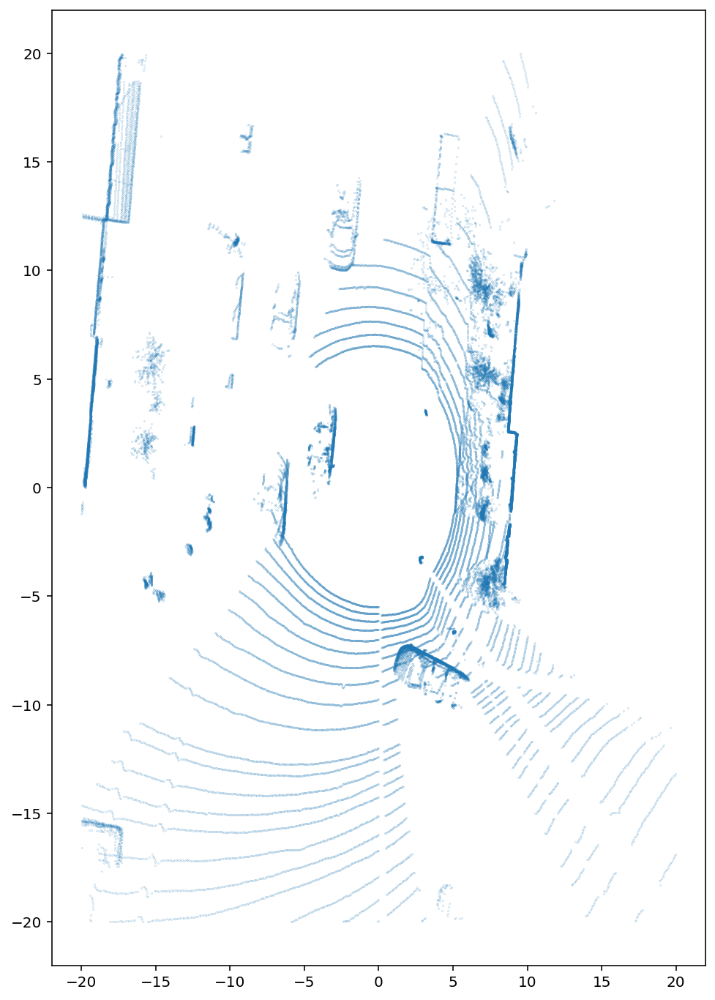

In [ ]:
show_bev('predict_pc/000012.bin', -2, 2)

In [ ]:
show_point_cloud('predict_pc/000012.bin')

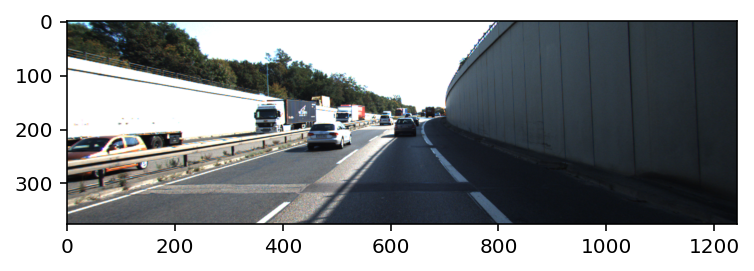

In [ ]:
read_image('testing/image_2/000012.png', show=True)

Looks good! Our model works!